In [2]:
using Flight.FlightCore
using Flight.FlightLib
using Flight.FlightAircraft
using Flight.FlightAircraft.C172Z.C172ZControl
using Flight.FlightLib.Control.Continuous: LinearizedSS, submodel
using Flight.FlightLib.Control.Discrete: PIDParams
using Flight.FlightLib.Control.PIDOpt: Settings, Metrics, optimize_PID, build_PID, check_results

using UnPack
using ControlSystems
using RobustAndOptimalControl
using ComponentArrays
using LinearAlgebra
using Plots

includet("c172z_design.jl"); using .C172ZControlDesign

In [3]:
global_search = false

aircraft = Cessna172Zv0(NED()) |> Model #linearization requires NED kinematics

h = 50
EAS = 25
flaps = C172ZControl.flaps_schedule(EAS)
payload = C172.PayloadY()
# design_point = C172.TrimParameters(; Ob = Geographic(LatLon(), HEllip(h)), EAS, flaps, payload)
design_point = C172.TrimParameters()
@show Float64(design_point.flaps)

#complete longitudinal model
lss_lon = get_design_model!(aircraft, design_point; model = :lon);
P_lon = named_ss(lss_lon);

x_labels_lon = keys(lss_lon.x0) |> collect
y_labels_lon = keys(lss_lon.y0) |> collect
u_labels_lon = keys(lss_lon.u0) |> collect

lss_lon.A[:h, :] |> display
lss_lon.A[:, :h] |> display
lss_lon.C[:, :h] |> display


Float64(design_point.flaps) = 0.0


ComponentVector{Float64}(q = 0.0, θ = 52.57176299393177, EAS = 8.408527032718652e-10, α = -52.5717415925581, h = 2.0655693349917477e-12, α_filt = 0.0, n_eng = 0.0, thr_p = 0.0, ele_p = 0.0)

ComponentVector{Float64}(q = -4.170438022557024e-5, θ = 4.06308966300209e-10, EAS = -0.00020182036390880222, α = 2.0223659225291908e-8, h = 2.0655693349917477e-12, α_filt = -1.1852239331582469e-20, n_eng = 0.0002806578002138302, thr_p = 0.0, ele_p = 0.0)

ComponentVector{Float64}(q = 0.0, θ = 0.0, EAS = 0.0, α = -3.1345069047189165e-22, h = 1.0, α_filt = 0.0, n_eng = 0.0, thr_p = 0.0, ele_p = 0.0, f_x = -0.00023772596171020747, f_z = 1.226626886718105e-7, TAS = 0.002582869085494968, γ = 2.207318771286332e-14, climb_rate = 2.0655693349917477e-12, throttle_cmd = 0.0, elevator_cmd = 0.0)

As one would expect, $\dot{h}$ is nonzero for nonzero $\theta$ or $\alpha$. This can be an issue
when designing a LQR tracker, which requires a combination of reference values $\Delta x^*$ and
$\Delta u^*$ that achieve static equilibrium for an arbitrary reference command vector $\Delta z^*$.
If such static equilibrium does not exist, the block $H_x F^{-1} G$, whose inverse is involved in
the computation of the feedforward gain matrix, will be singular.

The presence of $h$ in the state vector means that, for most choices of longitudinal command
variables, this static equilibrium indeed does not exist. This should be intuitively obvious, since
in general any useful command we might want to track will involve $\dot{h} \neq 0$. This would not
be the case if we picked for instance $h$ and $EAS$ as command variables, because true equilibrium
with $\dot{h}=0$ exists for an arbitrary combination of the two. However, this is not an appealing
choice, because we would like to control the pitch axis explicitly, rather than implicitly through
$h$.

A possible solution might be to partition the state and work with quasi-static equilibrium (see
Stengel). But there is another problem: the coupling of $h$ into the engine model introduces an
uncontrollable pole, whose effects are particularly noticeable in the throttle's dynamic response.

Since the coupling of $h$ into the remaining states is very weak, we can avoid the inconvenience by
simply dropping $h$ from the state. We then design the controllers on the reduced plant, and
return to the full plant later on for the altitude hold design.

In [4]:
x_labels_red = copy(x_labels_lon)
y_labels_red = copy(y_labels_lon)
u_labels_red = copy(u_labels_lon)

x_labels_red = deleteat!(x_labels_red, findfirst(isequal(:h), x_labels_red))
y_labels_red = deleteat!(y_labels_red, findfirst(isequal(:h), y_labels_red))

# x_labels_red = deleteat!(x_labels_red, findfirst(isequal(:α_filt), x_labels_red))
# y_labels_red = deleteat!(y_labels_red, findfirst(isequal(:α_filt), y_labels_red))

#reduced longitudinal model
lss_red = submodel(lss_lon; x = x_labels_red, u = u_labels_red, y = y_labels_red)
P_red = submodel(P_lon; x = x_labels_red, u = u_labels_red, y = y_labels_red)


NamedStateSpace{Continuous, Float64}
A = 
 -5.078949132101902    -4.168654130339011e-6   -0.01724609662305916     -202.145230526769         147.51432906320764      1.0463598368592624       0.0                 14.00465174698973
  0.9999996009938852   -4.114966437620653e-14   1.659334090770666e-7       4.116876448350825e-12    0.0                   0.0                      0.0                  0.0
  2.9087029815806633   -9.427941829016955      -0.08336483530793869      118.41732129378862       -85.6370388101205       5.03570729664301         0.0                 -7.516676821537426
  0.9713139629979192    1.2468096803394545e-7  -0.007405900957332301      -3.1772345228290795       0.6592740180751259   -0.0020391948664517084    0.0                  0.09783792693236244
  0.0                   0.0                    -1.6832659242197525e-18    49.99999999999999       -50.0                   0.0                      0.0                  0.0
  0.07344116199382551   0.0                     0.09844

In [5]:
dampreport(P_lon)
dampreport(P_red)

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -0.000511          |  1            |  0.000511     |  8.14e-05     |  1.96e+03     |
| -0.0192 ±  0.233im |  0.0821       |  0.234        |  0.0372       |  52.1         |
| -5.54   ±   6.27im |  0.662        |  8.37         |  1.33         |  0.18         |
| -11.7              |  1            |  11.7         |  1.86         |  0.0857       |
| -20                |  1            |  20           |  3.18         |  0.05         |
| -20                |  1            |  20           |  3.18         |  0.05         |
| -47.2              |  1            |  47.2         |  7.51         |  0.0212       |
|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (r

In [6]:
cond(P_lon.A) |> display
cond(P_red.A) |> display

3.083609444101087e7

66694.43559819505

## 1. Pitch Stability Augmentation

We now tackle the design of a throttle-decoupled LQR tracker as a pitch SAS, with only elevator as
both command variable and control input. Therefore, steady-state errors are of little importance;
the actual tracking of longitudinal command variables ($q$, $\theta$) will be handled by outer
feedback loops.

We will use a SISO model retaining only pitch dynamics. Since we are only keeping elevator command
as an input, we also need to drop all engine-related states in addition to $h$ in order to keep the
system controllable.

In [7]:
x_labels_pit = [:q, :θ, :EAS, :α, :α_filt, :ele_p]
y_labels_pit = vcat(x_labels_pit, [:f_x, :f_z, :TAS, :γ, :climb_rate, :elevator_cmd])
u_labels_pit = [:elevator_cmd,]

#pitch dynamics model
lss_pit = submodel(lss_red; x = x_labels_pit, u = u_labels_pit, y = y_labels_pit)
P_pit = named_ss(lss_pit);

In [8]:
dampreport(P_red)
dampreport(P_pit)

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -0.0194 ±  0.233im |  0.0832       |  0.234        |  0.0372       |  51.4         |
| -5.54   ±   6.27im |  0.662        |  8.37         |  1.33         |  0.18         |
| -11.7              |  1            |  11.7         |  1.86         |  0.0857       |
| -20                |  1            |  20           |  3.18         |  0.05         |
| -20                |  1            |  20           |  3.18         |  0.05         |
| -47.2              |  1            |  47.2         |  7.51         |  0.0212       |
|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+-----

In [9]:
cond(P_red.A) |> display
cond(P_pit.A) |> display

66694.43559819505

71002.96282530359

In [10]:
# ensure consistency in component selection and ordering between our pitch
# design model and avionics implementation for state and control vectors
@assert tuple(x_labels_pit...) === propertynames(C172ZControl.XLonPitch())

x_trim_pit = lss_pit.x0
u_trim_pit = lss_pit.u0

n_x = length(x_labels_pit)
n_u = length(u_labels_pit)

@show tuple(x_labels_pit...)
@show propertynames(C172ZControl.XLonPitch())

z_labels = [:elevator_cmd,]

z_trim = lss_pit.y0[z_labels]
n_z = length(z_labels)

F = lss_pit.A
G = lss_pit.B
Hx = lss_pit.C[z_labels, :]
Hu = lss_pit.D[z_labels, :]

#weight matrices
#trade-off between q, θ and EAS vs elevator_cmd
Q = C172ZControl.XLonPitch(q = 1, θ = 20, EAS = 0.01, α = 0, α_filt = 0, ele_p = 0) |> diagm
R = [3.0] |> diagm #elevator_cmd weight

#feedback gain matrix
C_fbk = lqr(P_pit, Q, R)

#forward gain matrix
A = [F G; Hx Hu]
B = inv(A)
B_12 = B[1:n_x, n_x+1:end]
B_22 = B[n_x+1:end, n_x+1:end]
C_fwd = B_22 + C_fbk * B_12

#no integral control
C_int = zeros(n_u, n_z)

#useful signal labels
u_labels_pit_fbk = Symbol.(string.(u_labels_pit) .* "_fbk")
u_labels_pit_fwd = Symbol.(string.(u_labels_pit) .* "_fwd")
u_labels_pit_sum = Symbol.(string.(u_labels_pit) .* "_sum")
z_labels_ref = Symbol.(string.(z_labels) .* "_ref")

C_fbk_ss = named_ss(ss(C_fbk), u = x_labels_pit, y = u_labels_pit_fbk)
C_fwd_ss = named_ss(ss(C_fwd), u = z_labels_ref, y = u_labels_pit_fwd)

#summing junctions
elevator_sum = sumblock("elevator_cmd_sum = elevator_cmd_fwd - elevator_cmd_fbk")

connections = vcat(
    Pair.(x_labels_pit, x_labels_pit),
    Pair.(u_labels_pit_fbk, u_labels_pit_fbk),
    Pair.(u_labels_pit_sum, u_labels_pit),
    Pair.(u_labels_pit_fwd, u_labels_pit_fwd)
    )


tuple(x_labels_pit...) = (:q, :θ, :EAS, :α, :α_filt, :ele_p)
propertynames(C172ZControl.XLonPitch()) = (:q, :θ, :EAS, :α, :α_filt, :ele_p)


9-element Vector{Pair{Symbol, Symbol}}:
                :q => :q
                :θ => :θ
              :EAS => :EAS
                :α => :α
           :α_filt => :α_filt
            :ele_p => :ele_p
 :elevator_cmd_fbk => :elevator_cmd_fbk
 :elevator_cmd_sum => :elevator_cmd
 :elevator_cmd_fwd => :elevator_cmd_fwd

After designing the LQR tracker on the pitch dynamics plant, we connect it to the reduced
longitudinal dynamics plant

In [11]:
#connect to the pitch dynamics model (this one is for comparison only)
P_pit_te = connect([P_pit, elevator_sum, C_fbk_ss, C_fwd_ss],
    connections; w1 = z_labels_ref, z1 = P_pit.y)

#connect to the reduced longitudinal model (this is the one we'll keep)
P_red_te = connect([P_red, elevator_sum, C_fbk_ss, C_fwd_ss],
    connections; w1 = [:throttle_cmd, :elevator_cmd_ref], z1 = P_red.y)

#add dummy system to rename input throttle_cmd to throttle_cmd_ref
D_thr = named_ss(ss(1), u = [:throttle_cmd_ref,], y = [:throttle_cmd_ref, ])
P_red_te = connect([P_red_te, D_thr], [:throttle_cmd_ref => :throttle_cmd,];
    w1 = [:throttle_cmd_ref, :elevator_cmd_ref], z1 = P_red_te.y)

display(C_fbk_ss)
display(C_fwd_ss)
dampreport(P_pit_te)
dampreport(P_red_te)

NamedStateSpace{Continuous, Float64}
D = 
 0.27192362981018087  2.8091190571425058  -0.027229231969902085  -2.8594553640667826  0.8251104966057676  0.17188335123891138

Continuous-time state-space model
With state  names: 
     input  names: q θ EAS α α_filt ele_p
     output names: elevator_cmd_fbk


NamedStateSpace{Continuous, Float64}
D = 
 5.429842431554514

Continuous-time state-space model
With state  names: 
     input  names: elevator_cmd_ref
     output names: elevator_cmd_fwd


|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -0.259             |  1            |  0.259        |  0.0412       |  3.86         |
| -0.931             |  1            |  0.931        |  0.148        |  1.07         |
| -7.71   ±   5.57im |  0.811        |  9.51         |  1.51         |  0.13         |
| -18                |  1            |  18           |  2.86         |  0.0556       |
| -47.2              |  1            |  47.2         |  7.51         |  0.0212       |
|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -0.204             |  1            |  0.2

Since we have computed the feedforward gain for the pitch dynamics (instead of the reduced
longitudinal model, including the power plant), when connecting the LQR tracker to the reduced
longitudinal model we get a small but non-zero steady state error when tracking elevator
commands.


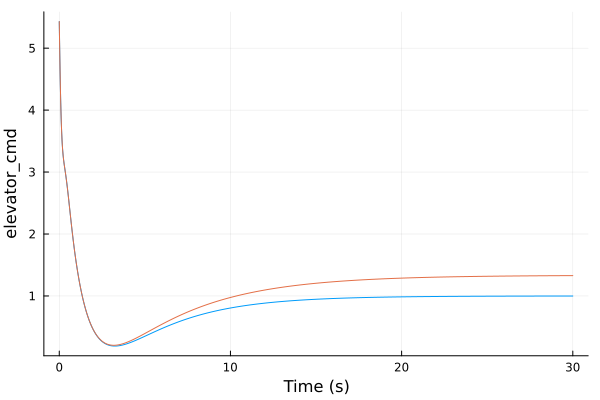

In [12]:
#closed-loop elevator reference command tracking when connected to pitch dynamics
e2e_cl_pit = P_pit_te[:elevator_cmd, :elevator_cmd_ref]
step(e2e_cl_pit, 30) |> plot
#closed-loop elevator reference command tracking when connected to reduced longitudinal dynamics
e2e_cl_red = P_red_te[:elevator_cmd, :elevator_cmd_ref]
step(e2e_cl_red, 30) |> plot!

This would not happen had we used the reduced longitudinal MIMO system for the LQR tracker design.
However, in that case, the off-diagonal elements in the 2x2 feedforward matrix would couple elevator
and throttle commands. As a consequence, changing the elevator command reference would result in
throttle activity, which is not a desirable behaviour. 

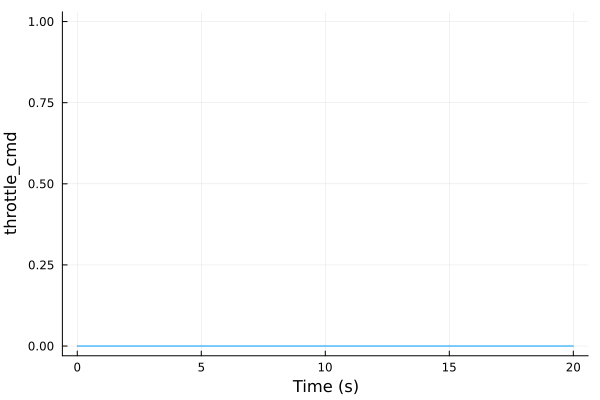

In [13]:
#closed-loop elevator reference to throttle command (no coupling!)
e2t_cl = P_red_te[:throttle_cmd, :elevator_cmd_ref]
step(e2t_cl, 20) |> plot

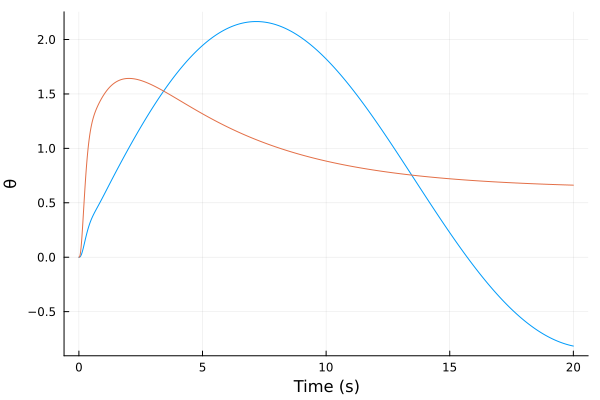

In [14]:
#open loop elevator-to-pitch angle response
e2θ_ol = P_red[:θ, :elevator_cmd]
#closed-loop elevator-to-pitch angle response
e2θ_cl = P_red_te[:θ, :elevator_cmd_ref]
step(e2θ_ol, 20) |> plot
step(e2θ_cl, 20) |> plot!

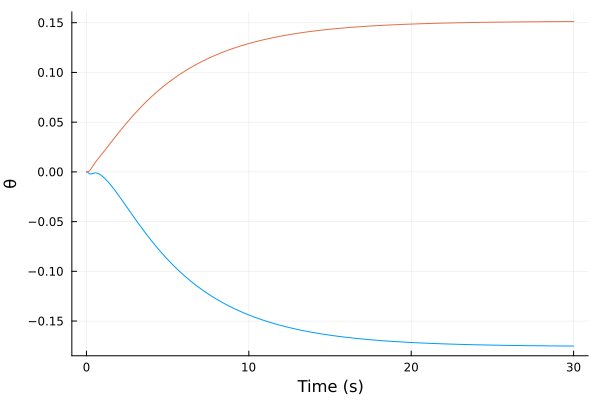

In [15]:
#throttle command to elevator command (pitch SAS reacts to throttle effects on pitch)
t2e_cl = P_red_te[:elevator_cmd, :throttle_cmd_ref]
step(t2e_cl, 30) |> plot
#a throttle step results in a slight, non-oscillating increase in pitch angle
t2θ_cl = P_red_te[:θ, :throttle_cmd_ref]
step(t2θ_cl, 30) |> plot!

## 2. $q \rightarrow e$

We now design a pitch rate to elevator CAS on top of the stabilized plant using classical SISO techniques.

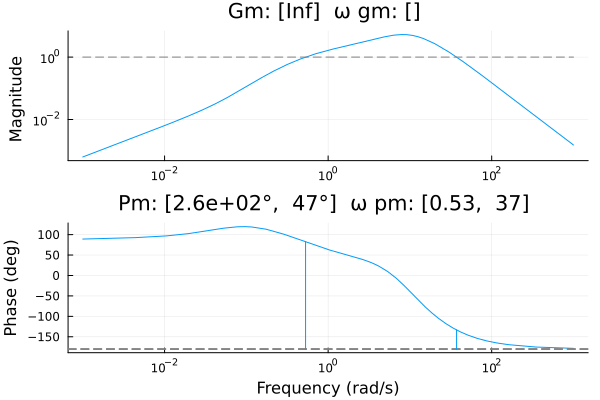

In [16]:
P_e2q = P_red_te[:q, :elevator_cmd_ref]
marginplot(P_e2q)

┌ Warning: Keyword argument hover not supported with Plots.GRBackend().  Choose from: annotationcolor, annotationfontfamily, annotationfontsize, annotationhalign, annotationrotation, annotations, annotationvalign, arrow, aspect_ratio, axis, background_color, background_color_inside, background_color_outside, background_color_subplot, bar_width, bins, bottom_margin, camera, clims, color_palette, colorbar, colorbar_entry, colorbar_scale, colorbar_title, colorbar_titlefont, colorbar_titlefontcolor, colorbar_titlefontrotation, colorbar_titlefontsize, connections, contour_labels, discrete_values, fill, fill_z, fillalpha, fillcolor, fillrange, fillstyle, flip, fontfamily, fontfamily_subplot, foreground_color, foreground_color_axis, foreground_color_border, foreground_color_grid, foreground_color_subplot, foreground_color_text, formatter, framestyle, grid, gridalpha, gridlinewidth, gridstyle, group, guide, guidefont, guidefontcolor, guidefontfamily, guidefonthalign, guidefontrotation, guidefo

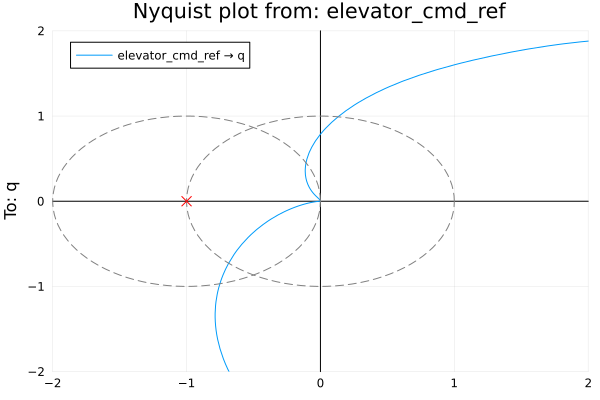

In [17]:
nyquistplot(P_e2q; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

The open loop gain goes to zero for $\omega\rightarrow 0$, so we will need two integrators in the loop transfer function in order to achieve a type-1 system and eliminate steady-state error. One of them will be a standalone integrator, the other one will be provided by the PID. 

In [18]:
q2e_int = tf(1, [1, 0]) |> ss
P_q2e_opt = series(q2e_int, ss(P_e2q))

t_sim_q2e = 10
lower_bounds = PIDParams(; k_p = 0.1, k_i = 0.0, k_d = 0.0, τ_f = 0.01)
upper_bounds = PIDParams(; k_p = 10.0, k_i = 50.0, k_d = 2.0, τ_f = 0.01)
settings = Settings(; t_sim = t_sim_q2e, lower_bounds, upper_bounds)
weights = Metrics(; Ms = 1, ∫e = 15, ef = 2, ∫u = 0.1, up = 0.00)
params_0 = PIDParams(; k_p = 2.0, k_i = 15, k_d = 0.4, τ_f = 0.01)

q2e_results = optimize_PID(P_q2e_opt; params_0, settings, weights, global_search)

@unpack k_p, k_i, k_d, T_i, T_d = q2e_results.params
@unpack k_p, k_i, k_d, T_i, T_d = q2e_results.params
@show k_p, k_i, k_d, T_i, T_d
@show q2e_results.metrics
@show q2e_results.exit_flag

(k_p, k_i, k_d, T_i, T_d) = (1.085923346222776, 8.981991870247233, 0.12396158376227544, 0.1209000589078562, 0.1141531620933075)
q2e_results.metrics = [1.2636042698251138, 0.02295598742039385, 0.0039554155839840455, 0.23922041273215494, 12.48208172245032]
q2e_results.exit_flag = :ROUNDOFF_LIMITED


:ROUNDOFF_LIMITED

In [19]:
#hand-tuned design for initialization
# q2e_PID = build_PID(PIDParams(; k_p = 2, k_i = 15, k_d = 0.4))
q2e_PID = build_PID(q2e_results.params)
C_q2e = named_ss(series(q2e_int, q2e_PID), :C_q2e; u = :q_err, y = :elevator_cmd_ref);

ε_q2e_cl(0) = [0.0;;]


StepInfo:
Initial value:     0.000
Final value:       0.996
Step size:         0.996
Peak:              1.153
Peak time:         0.522 s
Overshoot:         15.75 %
Undershoot:         0.00 %
Settling time:     0.904 s
Rise time:         0.169 s


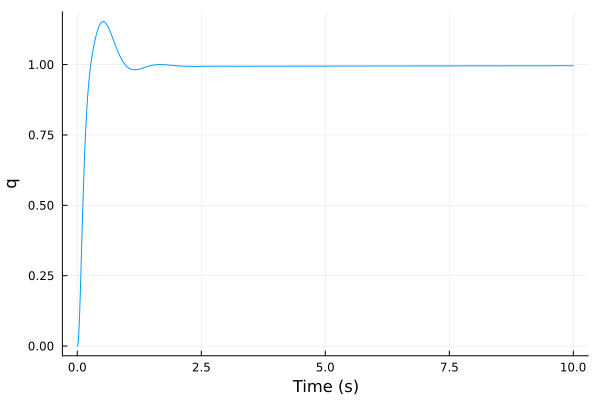

In [20]:
#steady-state error for a unit step input, now zero
L_q2e = series(C_q2e, P_e2q)
ε_q2e_cl = 1/(1+tf(L_q2e))
@show ε_q2e_cl(0)

#closed loop transfer function
T_q2e = output_comp_sensitivity(P_e2q, C_q2e)
T_q2e_step_SISO = step(T_q2e, t_sim_q2e)
stepinfo(T_q2e_step_SISO) |> display
T_q2e_step_SISO |> plot

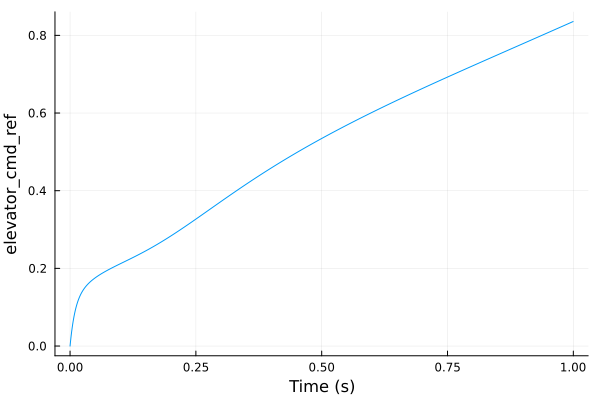

In [21]:
#pitch-rate reference (input) to elevator command (output) step response
CS_q2e_SISO = G_CS(P_e2q, C_q2e)
CS_q2e_step_SISO = step(CS_q2e_SISO, t_sim_q2e/10)
CS_q2e_step_SISO |> plot

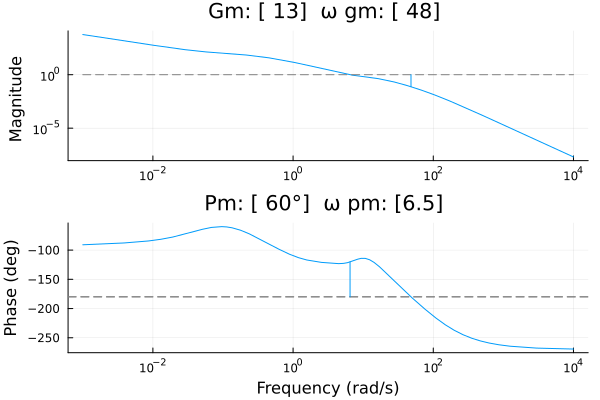

In [22]:
marginplot(L_q2e)

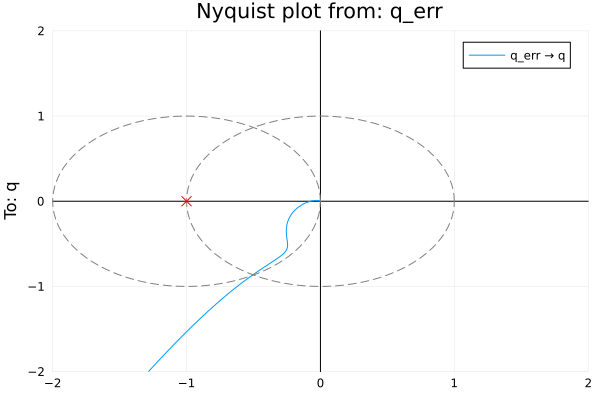

In [23]:
nyquistplot(L_q2e; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

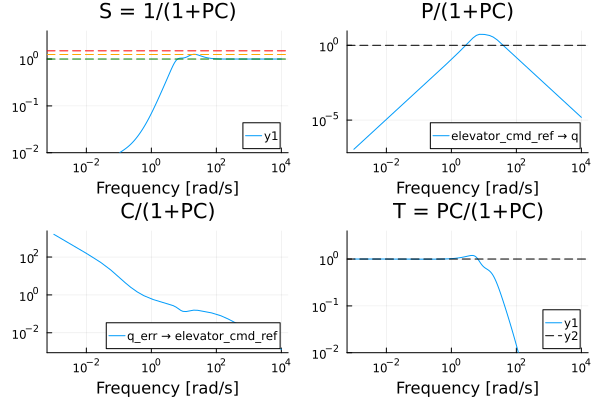

In [24]:
gangoffourplot(P_e2q, C_q2e)

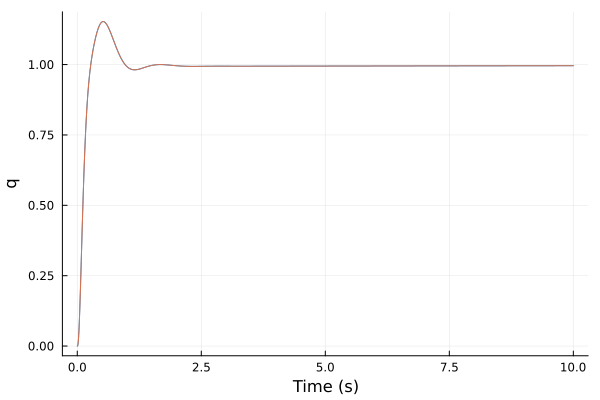

In [25]:
#connect the pitch-rate loop to the SAS-augmented reduced longitudinal model
q2e_sum = sumblock("q_err = q_ref - q")
P_red_tq = connect([P_red_te, q2e_sum, C_q2e], [:q_err=>:q_err, :q=>:q, :elevator_cmd_ref=>:elevator_cmd_ref], w1 = [:throttle_cmd_ref, :q_ref], z1 = P_red_te.y)

#verify the response matches that of the SISO closed loop
qref2q_MIMO = P_red_tq[:q, :q_ref]
step(qref2q_MIMO, t_sim_q2e) |> plot
T_q2e_step_SISO |> plot!

In [26]:
dampreport(P_red_tq)

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -2.74e-05          |  1            |  2.74e-05     |  4.36e-06     |  3.65e+04     |
| -0.0567            |  1            |  0.0567       |  0.00903      |  17.6         |
| -2.41              |  1            |  2.41         |  0.384        |  0.415        |
| -2.92   ±   5.35im |  0.479        |  6.09         |  0.969        |  0.343        |
| -11.7              |  1            |  11.7         |  1.86         |  0.0858       |
| -11.6   ±   14.1im |  0.636        |  18.3         |  2.91         |  0.086        |
| -20                |  1            |  20           |  3.18         |  0.05         |
| -47.8              |  1            |  47.8         |  7.6          |  0.0209       |
| -102               |  1            |  102

To avoid transients on mode changes, we want the initial output of the pitch rate loop to match the current value of the elevator command reference at the pitch SAS input, $e_{cmd,ref}$.

Whenever pitch rate mode is enabled after a mode change, we first reset both the integrator and the PID. Then we set PID integrator's state to the appropriate value to achieve the required $e_{cmd,ref}$. We have:
$$ y_{int} = 0 $$
$$ y_{pid} = k_p y_{int} + k_i x_{i0} = k_i x_{i0} = e_{cmd,ref} $$

Therefore:
$$x_{i0} = e_{cmd, ref}/k_i$$

## 3. $\theta \rightarrow q$


We start with the pitch-rate augmented plant, with throttle and elevator inputs.

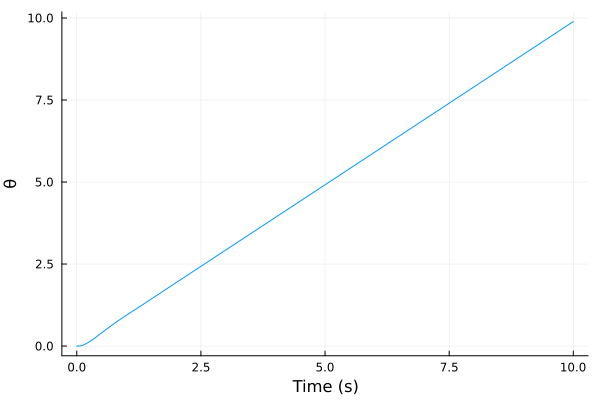

In [27]:
P_q2θ = P_red_tq[:θ, :q_ref]
step(P_q2θ, 10) |> plot

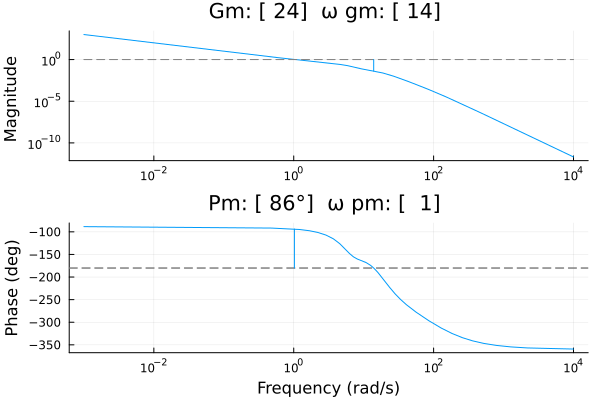

In [28]:
marginplot(P_q2θ)

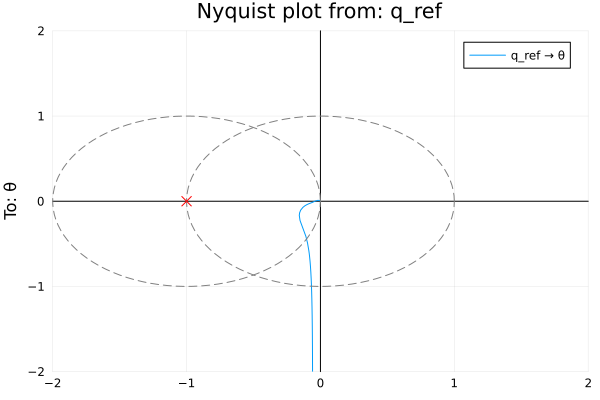

In [29]:
nyquistplot(P_q2θ; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

In [30]:
k_p_θ2q = 1
T_i_θ2q = Inf
T_d_θ2q = 0.0
τ_f_θ2q = 0.01
@show k_i_θ2q= k_p_θ2q/ T_i_θ2q
@show k_d_θ2q= k_p_θ2q* T_d_θ2q

θ2q_pid = k_p_θ2q * (1 + 1/T_i_θ2q * tf(1, [1, 0]) + T_d_θ2q * tf([1, 0], [τ_f_θ2q, 1]))
C_θ2q = θ2q_pid
C_θ2q = named_ss(ss(C_θ2q), :C_θ2q; u = :θ_err, y = :q_ref);
L_θ2q = series(C_θ2q, P_q2θ);

k_i_θ2q = k_p_θ2q / T_i_θ2q = 0.0
k_d_θ2q = k_p_θ2q * T_d_θ2q = 0.0


Testing this simple unit gain feedback design, we find out that it works well for the whole EAS range, so for now it does not seem warranted to use a gain scheduled PID compensator.

In [31]:
t_sim_θ2q = 10

10

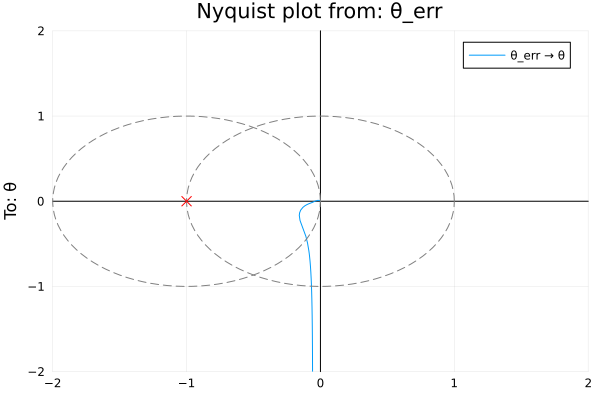

In [32]:
nyquistplot(L_θ2q; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

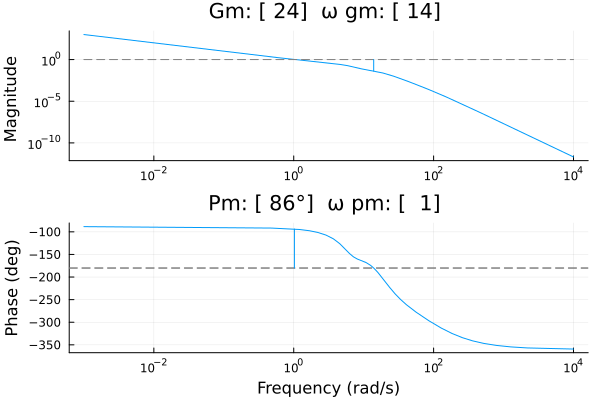

In [33]:
marginplot(L_θ2q)

StepInfo:
Initial value:     0.000
Final value:       1.000
Step size:         1.000
Peak:              1.000
Peak time:         9.999 s
Overshoot:          0.00 %
Undershoot:         0.00 %
Settling time:     3.843 s
Rise time:         2.011 s


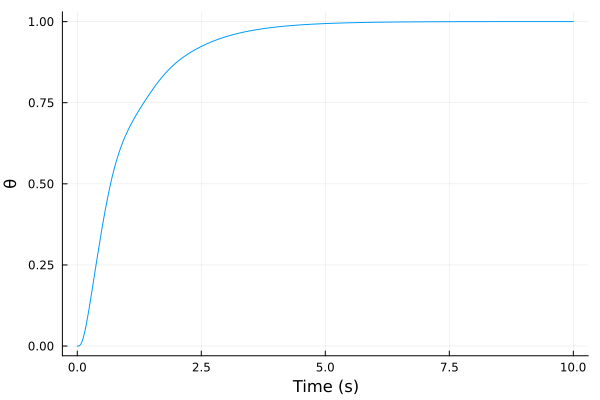

In [34]:
#closed loop transfer function
T_θ2q = output_comp_sensitivity(P_q2θ, C_θ2q)
T_θ2q_step_SISO = step(T_θ2q, t_sim_θ2q)
stepinfo(T_θ2q_step_SISO) |> display
T_θ2q_step_SISO |> plot

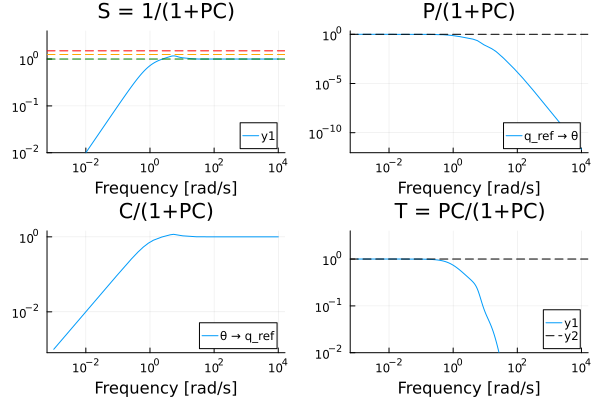

In [35]:
gangoffourplot(P_q2θ, C_θ2q)

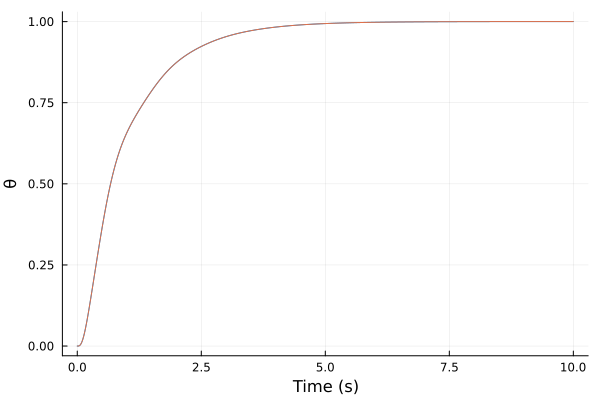

In [36]:
θ2q_sum = sumblock("θ_err = θ_ref - θ")
P_red_tθ = connect([P_red_tq, θ2q_sum, C_θ2q], [:θ_err=>:θ_err, :θ=>:θ, :q_ref=>:q_ref], w1 = [:throttle_cmd_ref, :θ_ref], z1 = P_red_tq.y);

#verify the response matches that of the SISO closed loop
θref2θ = P_red_tθ[:θ, :θ_ref]
step(θref2θ, t_sim_θ2q) |> plot
T_θ2q_step_SISO |> plot!

Our linear model comes from a horizontal, wings level flight condition, in which:
$$\dot{\theta} = q$$
However, in the general case we have the following kinematic relations:
$$
q = \dot{\theta} \cos \phi + \dot{\psi} \sin \phi \cos \theta \\
\dot{\psi} = \dfrac{1}{\cos \theta} (q \sin \phi + r \cos \phi)
$$

Substituting the second equation into the first and solving for q we arrive at:
$$
q(\dot{\theta}, r, \phi) = \dfrac{1}{\cos \phi}(\dot{\theta} + r \tan \phi)
$$

This shows that, when we have nonzero $r$ and nonzero $\phi$ (for example, during a turn), maintaining $\dot{\theta} = 0$ requires nonzero $q$. Also, as $\phi$ increases, the gain from $\dot{\theta}$ to $q$ decreases.

Since the $\theta$ controller design assumes $q = \dot{\theta}$, the $q_{sp}$ output by the $\theta$ controller should actually be interpreted as $\dot{\theta}_{sp}$ (or equivalently, the $q_{sp}$ we would need to track the desired $\theta$ in the absence of $r$ and $\phi$). The actual $q_{sp}$ required is given by:
$$q_{sp}=q(\dot{\theta}_{sp}, r, \phi)$$

What would happen during a turn if we didn't introduce this feedforward correction? Since the $\theta$ controller is purely proportional, it can only generate a nonzero output for nonzero $\theta$ error. Therefore, the necessary steady state $q = r \tan \phi$ required by the turn can only be achieved by the $\theta$ controller through a nonzero steady state $\theta$ error. This means that turning would always produce a nonzero steady-state $\theta$ error. The higher the turn rate, the larger the error.

Finally, to avoid transients on mode changes, we want the initial $\theta$ loop to produce $\dot{\theta}_{sp} = 0$ when $\theta_{sp}$ is initialized to the current $\theta$. Since this is only a proportional compensator this is unconditionally true:
$$\dot{\theta}_{sp} = k_p (\theta_{sp} - \theta)$$

## 4. EAS $\rightarrow \theta$


Starting from the $\theta$-augmented plant, we set the throttle aside for now and design a EAS to $\theta$ SISO loop.

TransferFunction{Continuous, ControlSystemsBase.SisoZpk{Float64, ComplexF64}}
                                                           (1.0s + 49.77602155596264)(1.0s^2 + 8.720784290807288s + 66.62169874916599)(1.0s^2 - 1.2892502998566338s + 13.634627405673315)(1.0s + 2.7509000938564987)(1.0s + 11.670846188142255)
-11005.253638001648---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                   (1.0s + 102.38634834879124)(1.0s + 47.75873413746784)(1.0s + 11.65975726224845)(1.0s^2 + 22.75702975808838s + 319.5094574853556)(1.0s + 2.6835746187263183)(1.0s^2 + 5.0918576335964865s + 34.756604291597085)(1.0s + 0.9957286421842123)(1.0s + 0.05718509501314679)

Continuous-time transfer function model

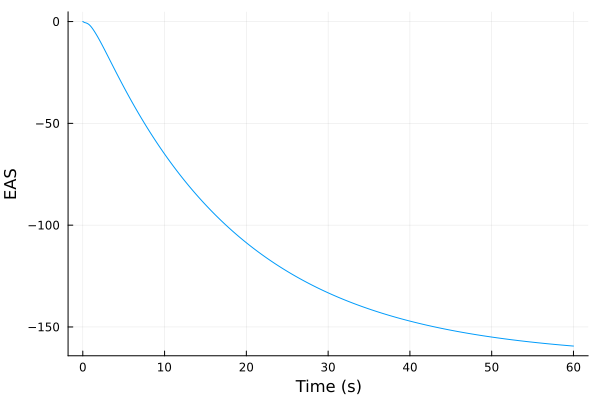

In [37]:
P_θ2v = P_red_tθ[:EAS, :θ_ref]
zpk(P_θ2v) |> display
step(P_θ2v, 60) |> plot

As expected, we have negative DC gain, so the compensator will require a sign inversion. For the PID
design task, we can provisionally move this inversion to the plant.

In [38]:
#define plant for optimization task
P_θ2v_opt = -P_θ2v;

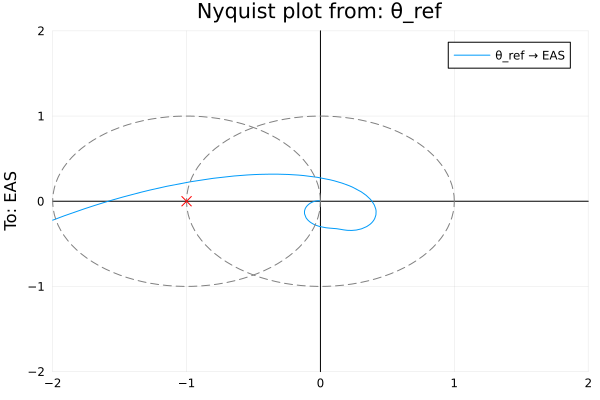

In [39]:
nyquistplot(P_θ2v_opt; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

In [40]:
t_sim_v2θ = 20
lower_bounds = PIDParams(; k_p = 0.01, k_i = 0.000, k_d = 0.0, τ_f = 0.01)
upper_bounds = PIDParams(; k_p = 0.2, k_i = 0.05, k_d = 0.0, τ_f = 0.01)
settings = Settings(; t_sim = t_sim_v2θ, lower_bounds, upper_bounds)
weights = Metrics(; Ms = 2.0, ∫e = 5.0, ef = 1.0, ∫u = 0.0, up = 0.0)
params_0 = PIDParams(; k_p = 0.05, k_i = 0.01, k_d = 0.0, τ_f = 0.01)

v2θ_results = optimize_PID(P_θ2v_opt; params_0, settings, weights, global_search)
v2θ_pid = build_PID(v2θ_results.params)

#return the sign inversion to the compensator
C_v2θ = -v2θ_pid
C_v2θ = named_ss(ss(C_v2θ), :C_v2θ; u = :EAS_err, y = :θ_ref)

#and concatenate with the non-inverted plant
L_v2θ = series(C_v2θ, P_θ2v);

@unpack k_p, k_i, k_d, τ_f, T_i, T_d = v2θ_results.params
@show k_p, k_i, k_d, τ_f, T_i, T_d
@show v2θ_results.metrics
@show v2θ_results.exit_flag;

(k_p, k_i, k_d, τ_f, T_i, T_d) = (0.03695291055509381, 0.002066690858307208, 0.0, 0.01, 17.880231291757553, 0.0)
v2θ_results.metrics = [1.2750445802036938, 0.15173764222648256, 0.0017275026146583716, 0.989171363320633, 0.9946074753107264]
v2θ_results.exit_flag = :ROUNDOFF_LIMITED


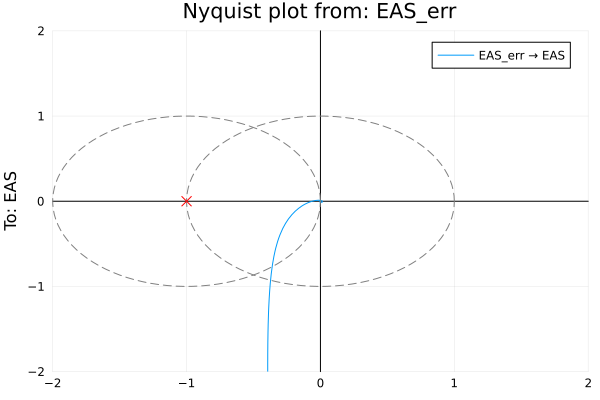

In [41]:
nyquistplot(L_v2θ; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))


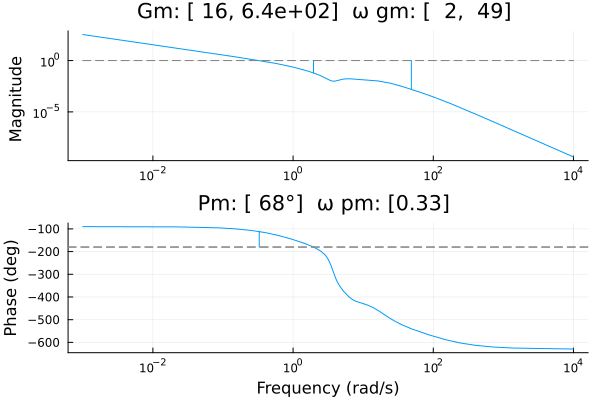

In [42]:
marginplot(L_v2θ)

StepInfo:
Initial value:     0.000
Final value:       0.998
Step size:         0.998
Peak:              1.018
Peak time:         8.801 s
Overshoot:          1.99 %
Undershoot:         0.00 %
Settling time:     6.398 s
Rise time:         4.150 s


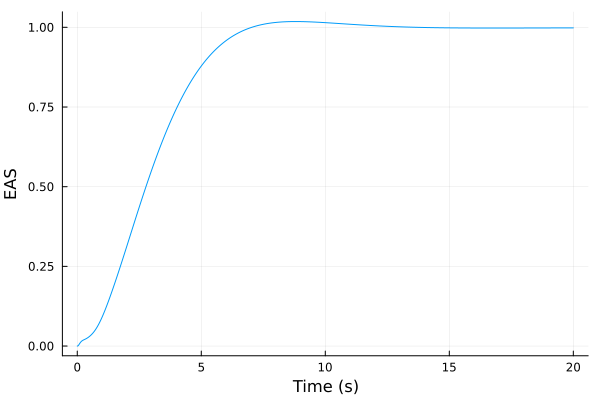

In [43]:
#closed loop transfer function
T_v2θ = output_comp_sensitivity(P_θ2v, C_v2θ)
T_v2θ_step_SISO = step(T_v2θ, t_sim_v2θ)
stepinfo(T_v2θ_step_SISO) |> display
T_v2θ_step_SISO |> plot

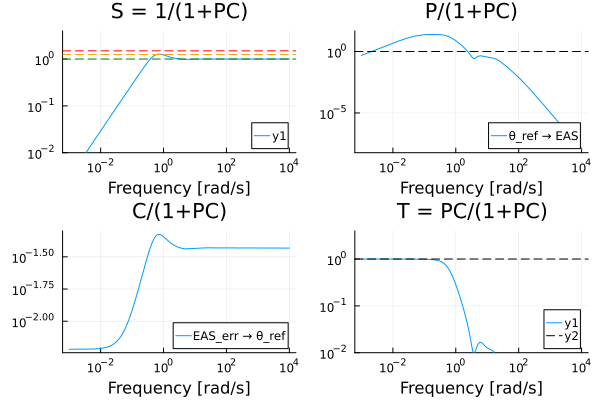

In [44]:
gangoffourplot(P_θ2v, C_v2θ)

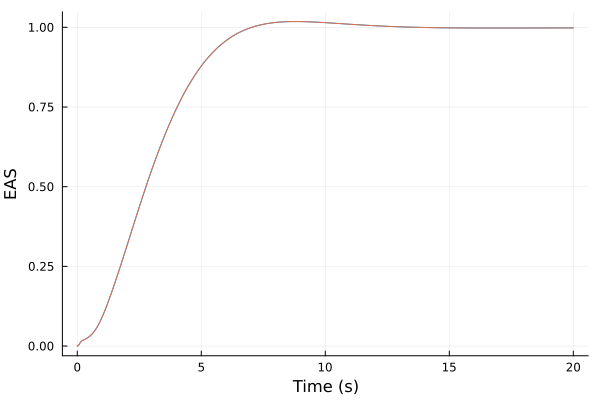

In [45]:
v2θ_sum = sumblock("EAS_err = EAS_ref - EAS")
P_red_tv = connect([P_red_tθ, v2θ_sum, C_v2θ], [:EAS_err=>:EAS_err, :EAS=>:EAS, :θ_ref=>:θ_ref], w1 = [:throttle_cmd_ref, :EAS_ref], z1 = P_red_tθ.y)

#verify the MIMO response against the SISO one
EASref2EAS = P_red_tv[:EAS, :EAS_ref]
step(EASref2EAS, t_sim_v2θ) |> plot
T_v2θ_step_SISO |> plot!

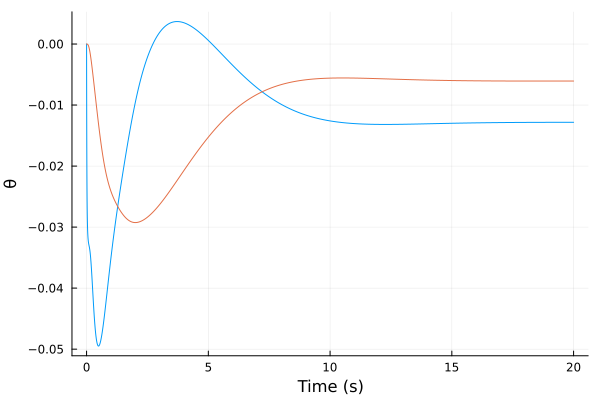

In [46]:
#EAS reference to elevator command step response
EASref2e = P_red_tv[:elevator_cmd, :EAS_ref]
#EAS reference to pitch angle step response
EASref2θ = P_red_tv[:θ, :EAS_ref]
step(EASref2e, t_sim_v2θ) |> plot
step(EASref2θ, t_sim_v2θ) |> plot!

To avoid transients on mode changes, we want the initial $\theta_{sp}$ output from the $v2\theta$ controller to match the current value of pitch angle $\theta$ when $EAS_{sp}$ matches the current $EAS$.

Whenever $v2\theta$ is enabled after a mode change, we reset the PID. Then we set the PID integrator's state to the appropriate value to achieve the required $\theta$. Noting the sign inversion, we have:
$$ y_{pid} = k_p (EAS_{sp} - EAS) + k_i x_{i0} = k_i x_{i0} $$
$$ \theta_{sp} = -y_{pid}$$

Therefore:
$$x_{i0} = y_{pid} / k_i = -\theta_{sp}/k_i = -\theta/k_i$$

## 5. $EAS \rightarrow t$

To design a SISO EAS-to-throttle controller, we need to start from a plant with pitch control
augmentation. The open-loop pitch response of the raw plant is unsuitable for this purpose, because
the lightly damped pitch oscillations induced by throttle changes couple back to the
EAS response.

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -0.0572            |  1            |  0.0572       |  0.0091       |  17.5         |
| -0.996             |  1            |  0.996        |  0.158        |  1            |
| -2.68              |  1            |  2.68         |  0.427        |  0.373        |
| -2.55   ±   5.32im |  0.432        |  5.9          |  0.938        |  0.393        |
| -11.7              |  1            |  11.7         |  1.86         |  0.0858       |
| -11.4   ±   13.8im |  0.637        |  17.9         |  2.84         |  0.0879       |
| -20                |  1            |  20           |  3.18         |  0.05         |
| -47.8              |  1            |  47.8         |  7.6          |  0.0209       |
| -102               |  1            |  102

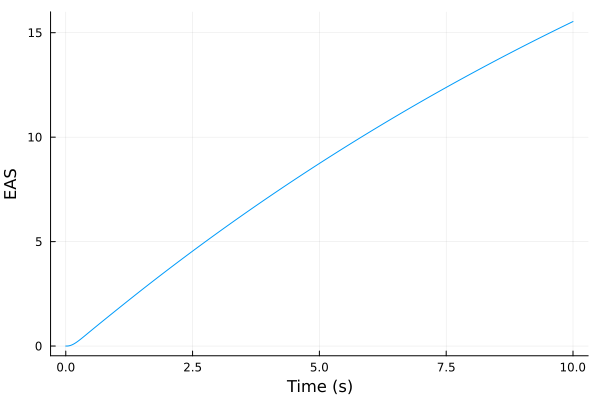

In [47]:
P_t2v = P_red_tθ[:EAS, :throttle_cmd]

dampreport(P_t2v)
step(P_t2v, 10) |> plot

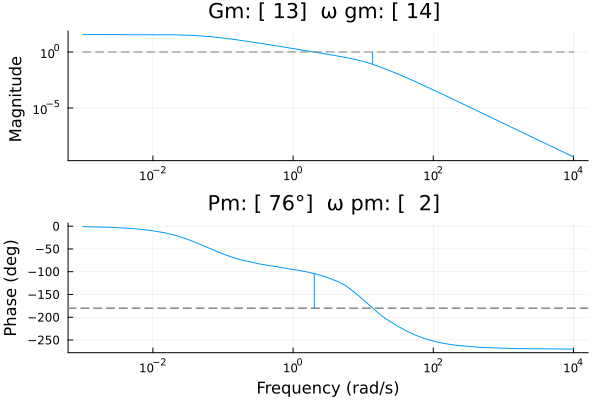

In [48]:
#error transfer function for a unit feedback closed loop and a unit step input
marginplot(P_t2v)

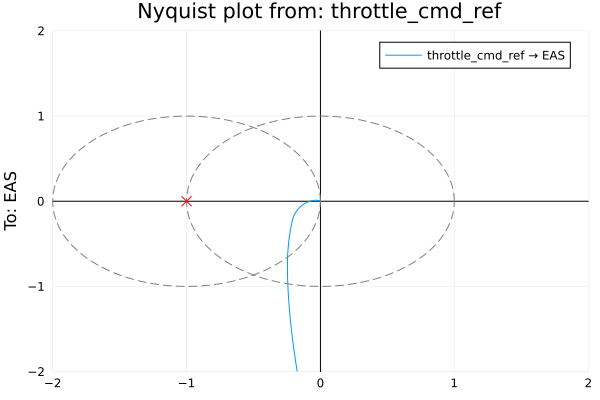

In [49]:
nyquistplot(P_t2v; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

In [50]:
t_sim_v2t = 10
lower_bounds = PIDParams(; k_p = 0.1, k_i = 0.0, k_d = 0.0, τ_f = 0.01)
upper_bounds = PIDParams(; k_p = 1.5, k_i = 0.5, k_d = 0.0, τ_f = 0.01)
settings = Settings(; t_sim = t_sim_v2t, maxeval = 5000, lower_bounds, upper_bounds)
weights = Metrics(; Ms = 2.0, ∫e = 5.0, ef = 1.0, ∫u = 0.0, up = 0.0)
params_0 = PIDParams(; k_p = 0.2, k_i = 0.1, k_d = 0.0, τ_f = 0.01)

v2t_results = optimize_PID(P_t2v; params_0, settings, weights, global_search)
v2t_PID = build_PID(v2t_results.params)

C_v2t = named_ss(ss(v2t_PID), :C_v2t; u = :EAS_err, y = :throttle_cmd_ref)
L_v2t = series(C_v2t, P_t2v)

@unpack k_p, k_i, k_d, T_i, T_d = v2t_results.params
@show k_p, k_i, k_d, T_i, T_d
@show v2t_results.metrics
@show v2t_results.exit_flag

(k_p, k_i, k_d, T_i, T_d) = (0.7333349973915673, 0.04193325464941748, 0.0, 17.488148809879092, 0.0)
v2t_results.metrics = [1.162346449715307, 0.06616676000537407, 4.745456354537936e-7, 0.9252043375965117, 0.9723269685091891]
v2t_results.exit_flag = :ROUNDOFF_LIMITED


:ROUNDOFF_LIMITED

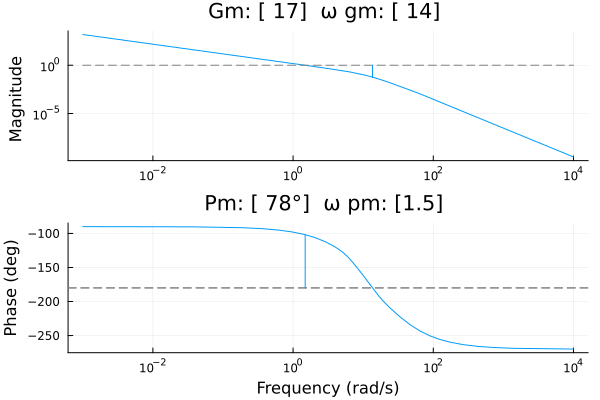

In [51]:
marginplot(L_v2t)

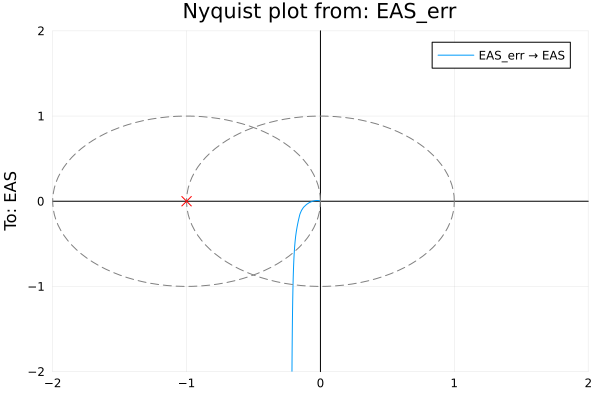

In [52]:
nyquistplot(L_v2t; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

StepInfo:
Initial value:     0.000
Final value:       1.000
Step size:         1.000
Peak:              1.000
Peak time:         4.833 s
Overshoot:          0.01 %
Undershoot:         0.00 %
Settling time:     2.082 s
Rise time:         1.140 s


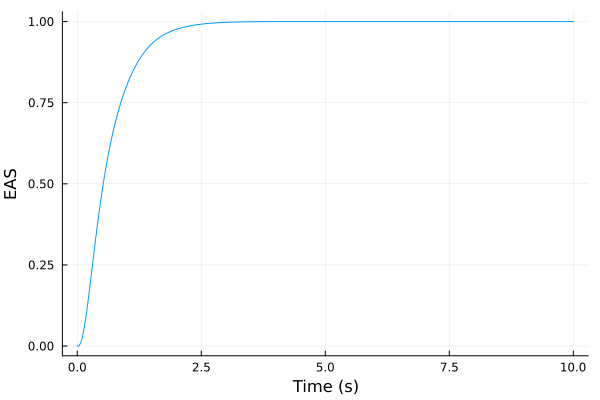

In [53]:
#closed loop transfer function
T_v2t = output_comp_sensitivity(P_t2v, C_v2t)
T_v2t_step = step(T_v2t, t_sim_v2t)
stepinfo(T_v2t_step) |> display
T_v2t_step |> plot

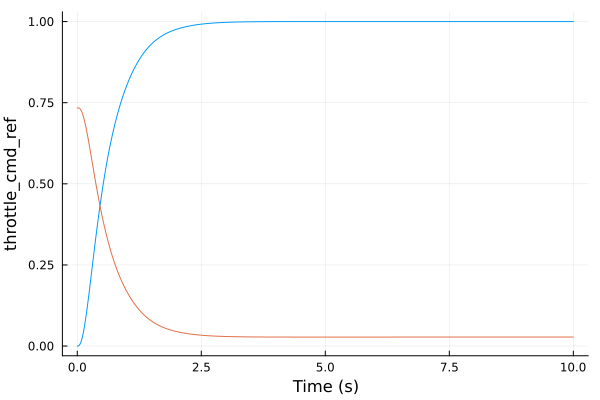

In [54]:
#EAS reference (input) to throttle command (output) step response
CS_v2t = G_CS(P_t2v, C_v2t)
CS_v2t_step = step(CS_v2t, t_sim_v2t)
CS_v2t_step |> plot!

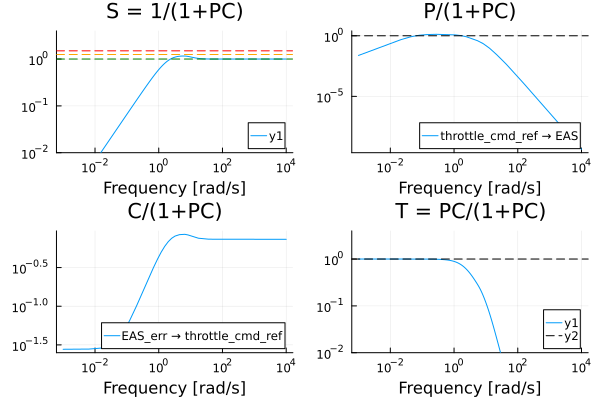

In [55]:
gangoffourplot(P_t2v, C_v2t)

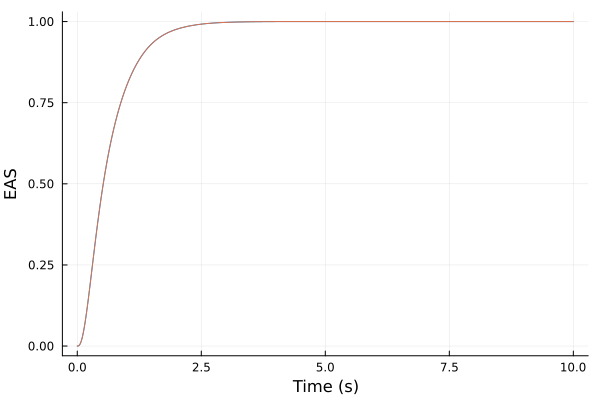

In [56]:
v2t_sum = sumblock("EAS_err = EAS_ref - EAS")
P_red_vθ = connect([P_red_tθ, v2t_sum, C_v2t], [:EAS_err=>:EAS_err, :EAS=>:EAS, :throttle_cmd_ref=>:throttle_cmd_ref], w1 = [:EAS_ref, :θ_ref], z1 = P_red_tθ.y)

#cross-check the SISO and MIMO responses
EASref2EAS = P_red_vθ[:EAS, :EAS_ref]
step(EASref2EAS, t_sim_v2t) |> plot
T_v2t_step |> plot!

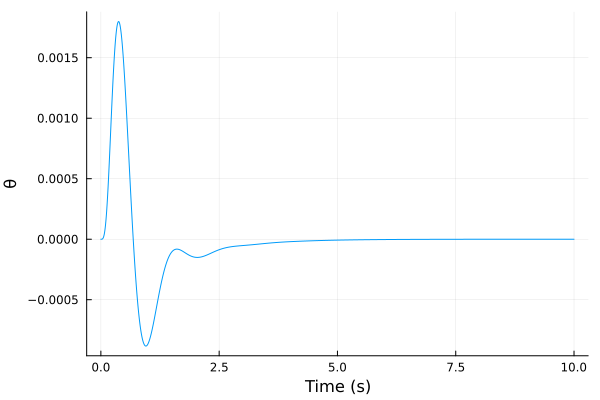

In [57]:
#EAS reference to pitch angle step response (negligible)
EASref2θ = P_red_vθ[:θ, :EAS_ref]
step(EASref2θ, t_sim_v2t) |> plot

To avoid transients on mode changes, we want the initial throttle command reference $thr_{ref}$ output from the $v2t$ controller to match the current value of throttle command $thr$ when $EAS_{sp}$ matches the current $EAS$. Whenever $v2t$ is enabled after a mode change, we reset the PID. Then we set the PID integrator's state to the appropriate value to achieve the required $thr$. We have:
$$thr_{ref} = y_{pid} = k_p (EAS_{ref} - EAS) + k_i x_{i0} = k_i x_{i0} = thr $$

Therefore:
$$x_{i0} = thr/k_i$$

## 6. Climb Rate $\rightarrow \theta$

We assume that this mode will be used together with some form of airspeed control, be it manual or automatic. If airspeed were not maintained, it is likely that in some parts of the envelope, an increase in $\theta$ will actually lead to an altitude loss after an initial surge. Thus, we start from the plant with closed-loop airspeed control via throttle. This scenario corresponds to the altitude hold mode.

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -0.0572            |  1            |  0.0572       |  0.0091       |  17.5         |
| -1.01              |  1            |  1.01         |  0.161        |  0.988        |
| -2.03              |  1            |  2.03         |  0.322        |  0.494        |
| -2.68              |  1            |  2.68         |  0.426        |  0.373        |
| -2.57   ±   5.38im |  0.431        |  5.96         |  0.949        |  0.389        |
| -7.69              |  1            |  7.69         |  1.22         |  0.13         |
| -11.5   ±   13.8im |  0.641        |  18           |  2.86         |  0.0869       |
| -21.6              |  1            |  21.6         |  3.44         |  0.0462       |
| -47.8              |  1            |  47.

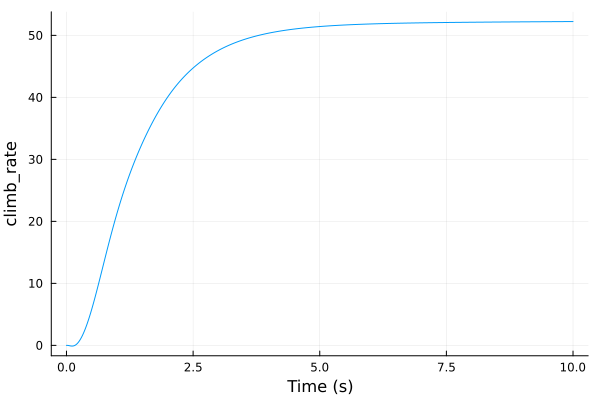

In [58]:
P_θ2c = P_red_vθ[:climb_rate, :θ_ref]

dampreport(P_θ2c)
step(P_θ2c, 10) |> plot

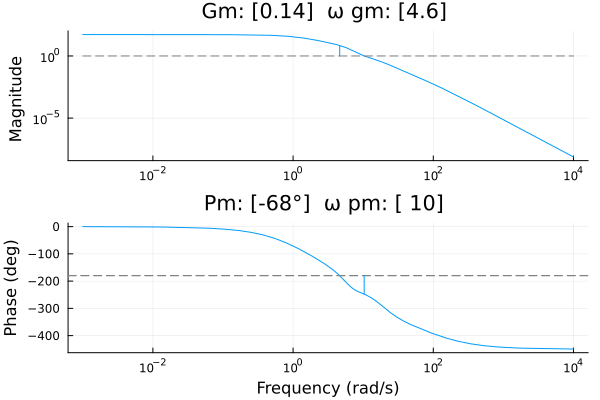

In [59]:
#error transfer function for a unit feedback closed loop and a unit step input
marginplot(P_θ2c)

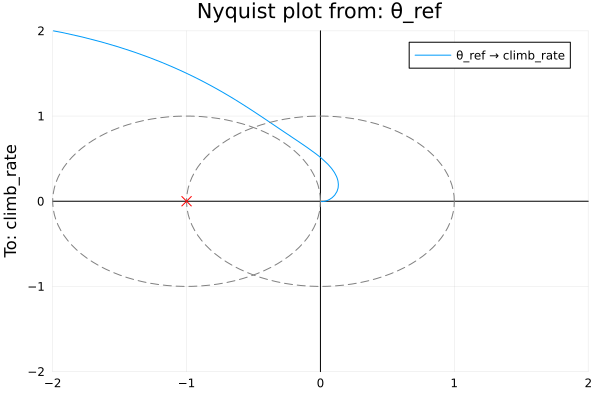

In [60]:
nyquistplot(P_θ2c; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

In [61]:
t_sim_c2θ = 20
lower_bounds = PIDParams(; k_p = 0.001, k_i = 0.001, k_d = 0.0, τ_f = 0.01)
upper_bounds = PIDParams(; k_p = 0.05, k_i = 0.03, k_d = 0.0, τ_f = 0.01)
settings = Settings(; t_sim = t_sim_c2θ, maxeval = 5000, lower_bounds, upper_bounds)
weights = Metrics(; Ms = 2.0, ∫e = 5.0, ef = 1.0, ∫u = 0.0, up = 0.1)
params_0 = PIDParams(; k_p = 0.02, k_i = 0.01, k_d = 0.0, τ_f = 0.01)

c2θ_results = optimize_PID(P_θ2c; params_0, settings, weights, global_search)
c2θ_PID = build_PID(c2θ_results.params)

C_c2θ = named_ss(ss(c2θ_PID), :C_c2θ; u = :climb_rate_err, y = :θ_ref)
L_c2θ = series(C_c2θ, P_θ2c)

@unpack k_p, k_i, k_d, T_i, T_d = c2θ_results.params
@show k_p, k_i, k_d, T_i, T_d
@show c2θ_results.metrics
@show c2θ_results.exit_flag

(k_p, k_i, k_d, T_i, T_d) = (0.01146769420540019, 0.011245520428215625, 0.0, 1.0197566469780375, 0.0)
c2θ_results.metrics = [1.215337549731485, 0.0858805253900271, 0.0008331252800413136, 0.9810835710242982, 0.9885323057945998]
c2θ_results.exit_flag = :ROUNDOFF_LIMITED


:ROUNDOFF_LIMITED

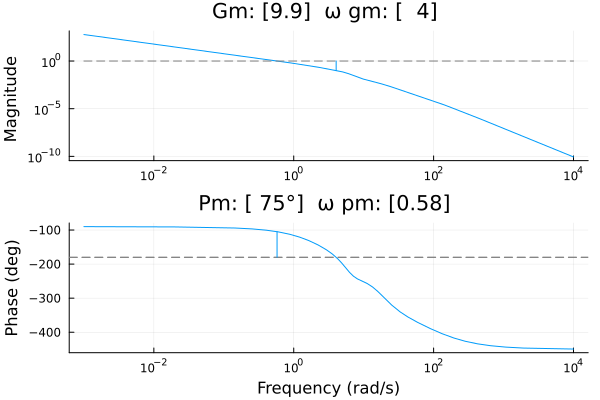

In [62]:
marginplot(L_c2θ)

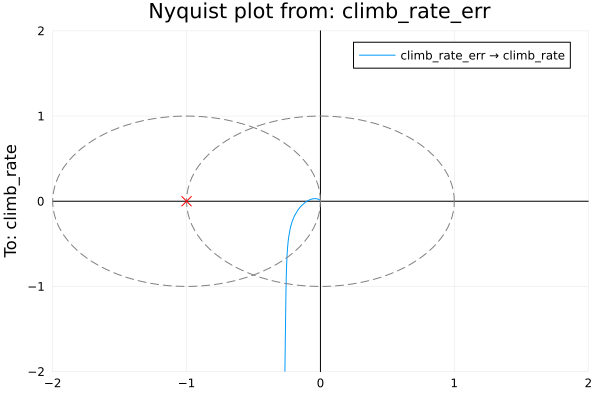

In [63]:
nyquistplot(L_c2θ; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

StepInfo:
Initial value:     0.000
Final value:       1.001
Step size:         1.001
Peak:              1.001
Peak time:        11.710 s
Overshoot:          0.04 %
Undershoot:         0.14 %
Settling time:     5.025 s
Rise time:         2.686 s


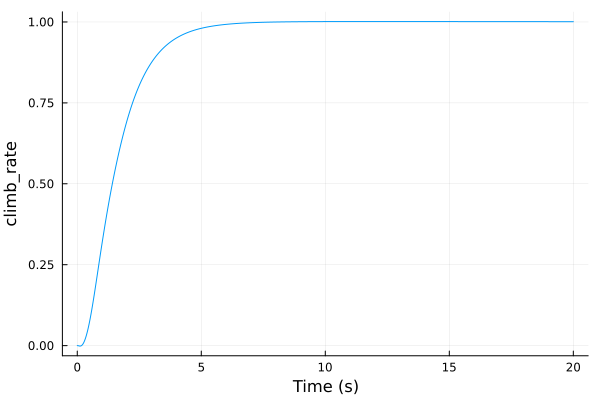

In [64]:
#closed loop transfer function
T_c2θ = output_comp_sensitivity(P_θ2c, C_c2θ)
T_c2θ_step = step(T_c2θ, t_sim_c2θ)
stepinfo(T_c2θ_step) |> display
T_c2θ_step |> plot

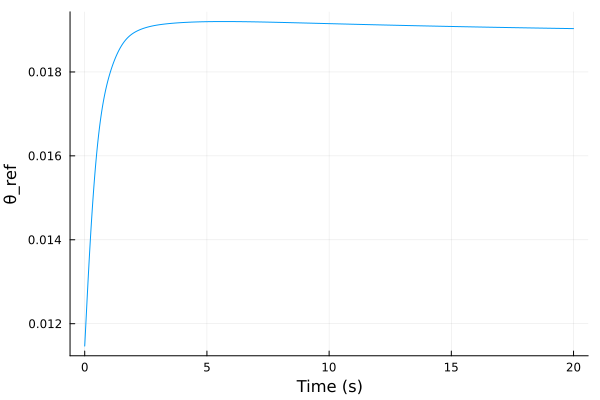

In [65]:
#climb rate reference (input) to pitch angle (output) step response
CS_c2θ = G_CS(P_θ2c, C_c2θ)
CS_c2θ_step = step(CS_c2θ, t_sim_c2θ)
CS_c2θ_step |> plot

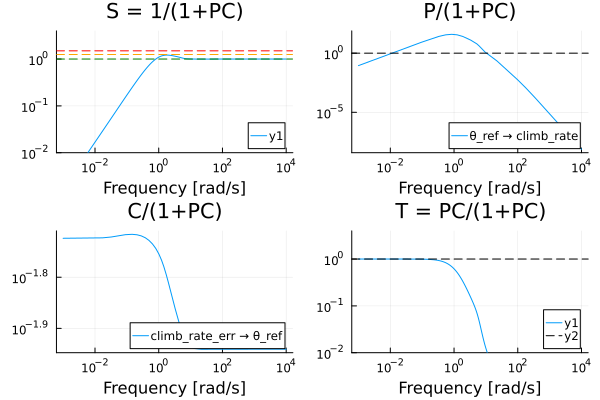

In [66]:
gangoffourplot(P_θ2c, C_c2θ)

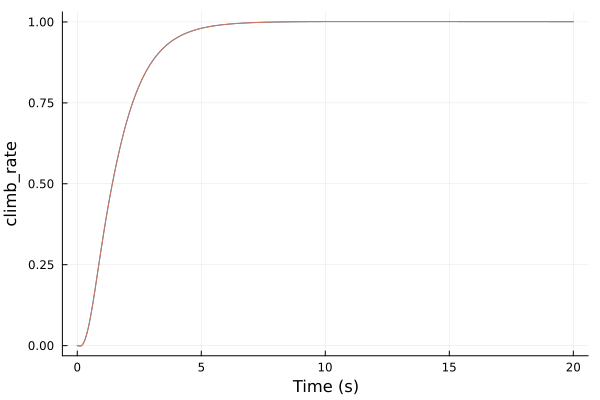

In [67]:
c2θ_sum = sumblock("climb_rate_err = climb_rate_ref - climb_rate")
P_red_vc = connect([P_red_vθ, c2θ_sum, C_c2θ], [:climb_rate_err=>:climb_rate_err, :climb_rate=>:climb_rate, :θ_ref=>:θ_ref], w1 = [:EAS_ref, :climb_rate_ref], z1 = P_red_vθ.y)

#cross-check the SISO and MIMO responses
crref2cr = P_red_vc[:climb_rate, :climb_rate_ref]
step(crref2cr, t_sim_c2θ) |> plot
T_c2θ_step |> plot!

To avoid transients on mode changes, we want the initial $\theta_{sp}$ output from the $c2\theta$ controller to match the current value of pitch angle $\theta$ when $c_{sp}$ matches the current climb rate.

Whenever $c2\theta$ is enabled after a mode change, we reset the PID. Then we set the PID integrator's state to the appropriate value to achieve the required $\theta$. We have:
$$ y_{pid} = k_p (clm_{sp} - clm) + k_i x_{i0} = k_i x_{i0} $$
$$ \theta_{sp} = y_{pid}$$

Therefore:
$$x_{i0} = y_{pid} / k_i = \theta_{sp}/k_i = \theta/k_i$$

## 7. $h \rightarrow c$

Now we address the design an altitude hold loop, assuming EAS and climb rate tracking are already
available. However, all of our previous compensators and intermediate plants have been built from
the reduced longitudinal dynamics, so the resulting `P_red_vc` does not have $h$ as a state. We need
to go back to the complete longitudinal dynamics, and then build the corresponding `P_full_vc` by
connecting the designed compensators in the same order as before: SAS, pitch rate, pitch angle, EAS,
and climb rate. Thus, we start from the EAS + climb rate plant.


In [68]:
P_lon_te = connect([P_lon, elevator_sum, C_fbk_ss, C_fwd_ss],
    connections; w1 = [:throttle_cmd, :elevator_cmd_ref], z1 = P_lon.y)

#add dummy system to rename input throttle_cmd to throttle_cmd_ref
D_thr = named_ss(ss(1), u = [:throttle_cmd_ref,], y = [:throttle_cmd_ref, ])
P_lon_te = connect([P_lon_te, D_thr], [:throttle_cmd_ref => :throttle_cmd,];
    w1 = [:throttle_cmd_ref, :elevator_cmd_ref], z1 = P_lon_te.y)

P_lon_tq = connect([P_lon_te, q2e_sum, C_q2e], [:q_err=>:q_err, :q=>:q, :elevator_cmd_ref=>:elevator_cmd_ref], w1 = [:throttle_cmd_ref, :q_ref], z1 = P_lon_te.y)
P_lon_tθ = connect([P_lon_tq, θ2q_sum, C_θ2q], [:θ_err=>:θ_err, :θ=>:θ, :q_ref=>:q_ref], w1 = [:throttle_cmd_ref, :θ_ref], z1 = P_lon_tq.y);
P_lon_vθ = connect([P_lon_tθ, v2t_sum, C_v2t], [:EAS_err=>:EAS_err, :EAS=>:EAS, :throttle_cmd_ref=>:throttle_cmd_ref], w1 = [:EAS_ref, :θ_ref], z1 = P_lon_tθ.y)
P_lon_vc = connect([P_lon_vθ, c2θ_sum, C_c2θ], [:climb_rate_err=>:climb_rate_err, :climb_rate=>:climb_rate, :θ_ref=>:θ_ref], w1 = [:EAS_ref, :climb_rate_ref], z1 = P_lon_vθ.y)

dampreport(P_red_tq)
dampreport(P_lon_tq)

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -2.74e-05          |  1            |  2.74e-05     |  4.36e-06     |  3.65e+04     |
| -0.0567            |  1            |  0.0567       |  0.00903      |  17.6         |
| -2.41              |  1            |  2.41         |  0.384        |  0.415        |
| -2.92   ±   5.35im |  0.479        |  6.09         |  0.969        |  0.343        |
| -11.7              |  1            |  11.7         |  1.86         |  0.0858       |
| -11.6   ±   14.1im |  0.636        |  18.3         |  2.91         |  0.086        |
| -20                |  1            |  20           |  3.18         |  0.05         |
| -47.8              |  1            |  47.8         |  7.6          |  0.0209       |
| -102               |  1            |  102

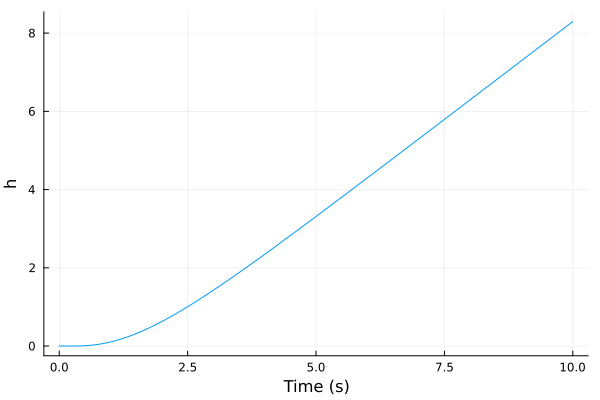

In [69]:
#open loop climb-rate to altitude step response
P_c2h = P_lon_vc[:h, :climb_rate_ref]
step(P_c2h, 10) |> plot

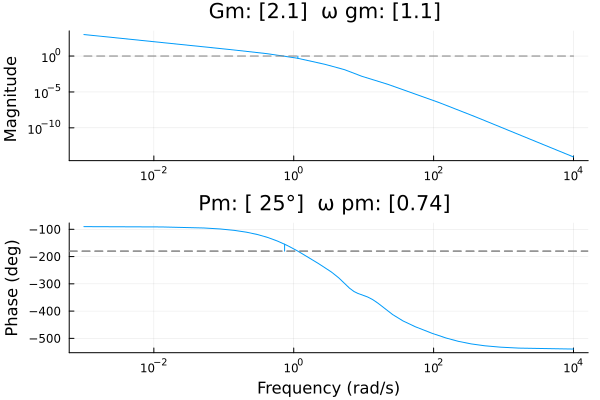

In [70]:
marginplot(P_c2h)

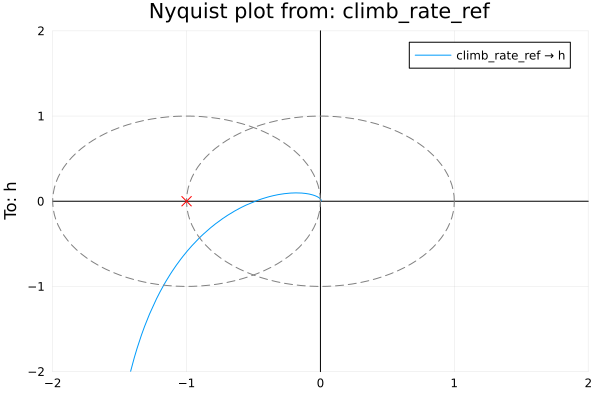

In [71]:
nyquistplot(P_c2h; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

In [72]:
t_sim_h2c = 30
k_h2c = 0.2
C_h2c = named_ss(ss(k_h2c), :C_h2c; u = :h_err, y = :climb_rate_ref);
#loop transfer function
L_h2c = series(C_h2c, P_c2h);#

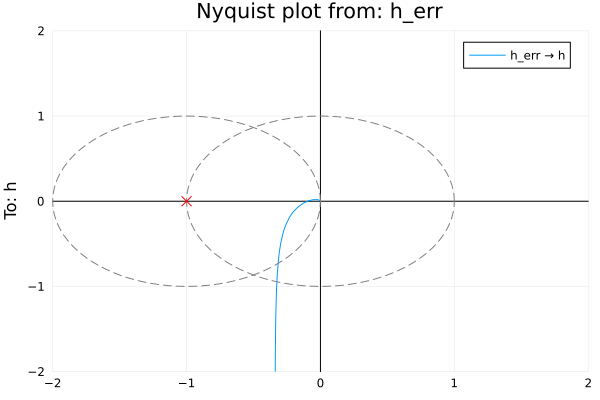

In [73]:
nyquistplot(L_h2c; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

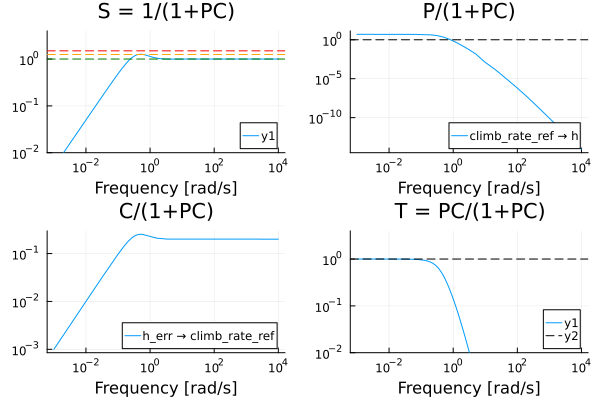

In [74]:
gangoffourplot(P_c2h, C_h2c)

StepInfo:
Initial value:     0.000
Final value:       1.000
Step size:         1.000
Peak:              1.001
Peak time:        18.686 s
Overshoot:          0.11 %
Undershoot:         0.00 %
Settling time:    12.233 s
Rise time:         7.160 s


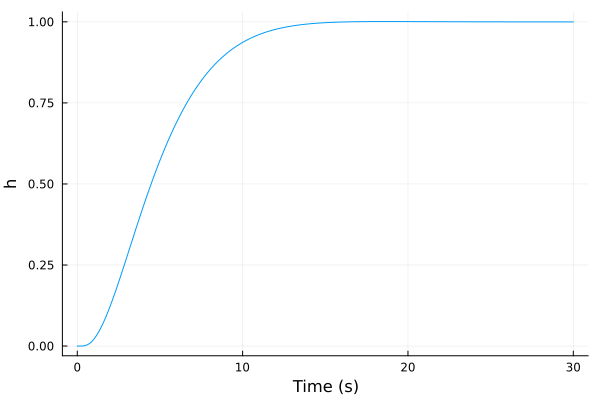

In [75]:
#closed loop transfer function
T_h2c = output_comp_sensitivity(P_c2h, C_h2c)
T_h2c_step = step(T_h2c, t_sim_h2c)
stepinfo(T_h2c_step) |> display
T_h2c_step |> plot

## 8. $EAS + h \rightarrow t + e$

The proportional SISO altitude loop above is designed on the type-1 plant provided by the climb rate
loop. It provides zero steady-state error for constant altitude commands, and cancellation of
constant vertical wind components. However, it cannot track a ramp altitude command with zero
steady-state error. This capability would enable the altitude loop to be used for flying a landing
approach. The following LQR tracker design has EAS and altitude as command variables, with
integrators for both of them. The integral action on altitude achieves the desired type-2 behavior.


In [85]:
P_vh = let lss = lss_lon
    x_trim = lss.x0
    n_x = length(x_trim)
    x_labels = collect(keys(x_trim))
    @assert tuple(x_labels...) === propertynames(C172ZControl.XLonFull())

    u_trim = lss.u0
    n_u = length(u_trim)
    u_labels = collect(keys(u_trim))
    @assert tuple(u_labels...) === propertynames(C172ZControl.ULonFull())

    z_labels = [:EAS, :h]
    z_trim = lss.y0[z_labels]
    n_z = length(z_labels)
    @assert tuple(z_labels...) === propertynames(C172ZControl.Zvh())

    F = lss.A
    G = lss.B
    Hx = lss.C[z_labels, :]
    Hu = lss.D[z_labels, :]
    # display(Hx)
    # display(Hu)

    #define the blocks corresponding to the subset of the command variables for
    #which integral compensation is required
    Hx_int = Hx[z_labels, :]
    Hu_int = Hu[z_labels, :]
    n_int, _ = size(Hx_int)
    # display(Hx_int)
    # display(Hu_int)

    F_aug = [F zeros(n_x, n_int); Hx_int zeros(n_int, n_int)]
    G_aug = [G; Hu_int]
    Hx_aug = [Hx zeros(n_z, n_int)]
    Hu_aug = Hu

    P_aug = ss(F_aug, G_aug, Hx_aug, Hu_aug)
    @show controllability(F_aug, G_aug)

    #weight matrices
    Q = ComponentVector(q = 20, θ = 100, EAS = 0.06, α = 0, h = 0.06, α_filt = 0,
                        n_eng = 0, thr_p = 0, ele_p = 0,
                        ξ_EAS = 0.005, ξ_h = 0.001) |> diagm
    R = C172ZControl.ULonFull(throttle_cmd = 0.1, elevator_cmd = 0.05) |> diagm

    #compute gain matrix
    C_aug = lqr(P_aug, Q, R)

    # quickly construct the closed-loop augmented system to check the resulting
    # eigenvalues, we'll do the connections properly later
    F_aug_cl = F_aug - G_aug * C_aug
    P_aug_cl = ss(F_aug_cl, G_aug, Hx_aug, Hu_aug)

    A = [F G; Hx Hu]
    B = inv(A)
    B_12 = B[1:n_x, n_x+1:end]
    B_22 = B[n_x+1:end, n_x+1:end]

    #extract system state and integrator blocks from the feedback matrix
    C_x = C_aug[:, 1:n_x]
    C_ξ = C_aug[:, n_x+1:end]

    C_fbk = C_x
    C_fwd = B_22 + C_x * B_12
    C_int = C_ξ

    #some useful signal labels
    u_labels_fbk = Symbol.(string.(u_labels) .* "_fbk")
    u_labels_fwd = Symbol.(string.(u_labels) .* "_fwd")
    u_labels_sum = Symbol.(string.(u_labels) .* "_sum")
    u_labels_int_u = Symbol.(string.(u_labels) .* "_int_u")
    u_labels_int = Symbol.(string.(u_labels) .* "_int")
    u_labels_ξ = Symbol.(string.(u_labels) .* "_ξ")

    z_labels_ref = Symbol.(string.(z_labels) .* "_ref")
    z_labels_ref1 = Symbol.(string.(z_labels) .* "_ref1")
    z_labels_ref2 = Symbol.(string.(z_labels) .* "_ref2")
    z_labels_err = Symbol.(string.(z_labels) .* "_err")
    z_labels_sum = Symbol.(string.(z_labels) .* "_sum")
    z_labels_ref_fwd = Symbol.(string.(z_labels) .* "_ref_fwd")
    z_labels_ref_sum = Symbol.(string.(z_labels) .* "_ref_sum")

    #the integral gain matrix is constructed by padding C_ξ with zeros in those
    #columns corresponding to command variables without integral compensation
    C_fbk_ss = named_ss(ss(C_fbk), u = x_labels, y = u_labels_fbk)
    C_fwd_ss = named_ss(ss(C_fwd), u = z_labels_ref_fwd, y = u_labels_fwd)
    C_int_ss = named_ss(ss(C_int), u = z_labels_err, y = u_labels_int_u)

    int_ss = named_ss(ss(tf(1, [1,0])) .* I(2),
                        x = u_labels_ξ,
                        u = u_labels_int_u,
                        y = u_labels_int);

    EAS_err_sum = sumblock("EAS_err = EAS_sum - EAS_ref_sum")
    h_err_sum = sumblock("h_err = h_sum - h_ref_sum")

    throttle_cmd_sum = sumblock("throttle_cmd_sum = throttle_cmd_fwd - throttle_cmd_fbk - throttle_cmd_int")
    elevator_cmd_sum = sumblock("elevator_cmd_sum = elevator_cmd_fwd - elevator_cmd_fbk - elevator_cmd_int")

    EAS_ref_splitter = splitter(:EAS_ref, 2)
    h_ref_splitter = splitter(:h_ref, 2)

    connections = vcat(
        Pair.(x_labels, x_labels),
        Pair.(z_labels, z_labels_sum),
        Pair.(z_labels_ref1, z_labels_ref_sum),
        Pair.(z_labels_ref2, z_labels_ref_fwd),
        Pair.(z_labels_err, z_labels_err),
        Pair.(u_labels_sum, u_labels),
        Pair.(u_labels_fwd, u_labels_fwd),
        Pair.(u_labels_fbk, u_labels_fbk),
        Pair.(u_labels_int, u_labels_int),
        Pair.(u_labels_int_u, u_labels_int_u),
        )

    P_vh = connect([P_lon, int_ss, C_fwd_ss, C_fbk_ss, C_int_ss,
                    EAS_err_sum, h_err_sum,
                    throttle_cmd_sum, elevator_cmd_sum,
                    EAS_ref_splitter, h_ref_splitter], connections;
                    w1 = z_labels_ref, z1 = y_labels_lon)

    dampreport(P_aug_cl)
    dampreport(P_vh)
    @show C_fwd_ss

    P_vh

end


controllability(F_aug, G_aug) = (iscontrollable = true, ranks = [11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11], sigma_min = [0.09613179634670771, 2.909644179668581, 2.909644179668581, 1.5539971963969785, 0.7965522311393523, 0.7965522311393523, 0.20107602672992814, 0.20107602672992814, 0.20014807754261318, 0.20012915268127657, 0.20012915268127657])
|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+


┌ Warning: Connecting single output to multiple inputs Y1=Union{Nothing, Int64}[1, 2, 3, 4, 5, 6, 7, 8, 9, 3, 5, 29, 31, 30, 32, 25, 26, 27, 28, 19, 20, 21, 22, 17, 18, 23, 24]
└ @ ControlSystemsBase /Users/miguel/.julia/packages/ControlSystemsBase/qOZW0/src/connections.jl:360


| -0.13              |  1            |  0.13         |  0.0207       |  7.71         |
| -0.29              |  1            |  0.29         |  0.0462       |  3.44         |
| -1.35   ±  0.747im |  0.874        |  1.54         |  0.245        |  0.743        |
| -1.57              |  1            |  1.57         |  0.249        |  0.639        |
| -2.67              |  1            |  2.67         |  0.426        |  0.374        |
| -11.5              |  1            |  11.5         |  1.83         |  0.087        |
| -20                |  1            |  20           |  3.19         |  0.0499       |
| -49.3              |  1            |  49.3         |  7.84         |  0.0203       |
| -53.5   ±   52.7im |  0.712        |  75.1         |  12           |  0.0187       |
|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+-----

NamedStateSpace{Continuous, Float64}
A = 
   -5.078949132101902       -4.168654130339011e-6    -0.01724609662305916     -202.145230526769          -4.170438022557024e-5     147.51432906320764      1.0463598368592624       0.0                    14.00465174698973       0.0    0.0
    0.9999996009938852      -4.114966437620653e-14    1.659334090770666e-7       4.116876448350825e-12    4.06308966300209e-10       0.0                   0.0                      0.0                     0.0                    0.0    0.0
    2.9087029815806633      -9.427941829016955       -0.08336483530793869      118.41732129378862        -0.00020182036390880222   -85.6370388101205       5.03570729664301         0.0                    -7.516676821537426      0.0    0.0
    0.9713139629979192       1.2468096803394545e-7   -0.007405900957332301      -3.1772345228290795       2.0223659225291908e-8      0.6592740180751259   -0.0020391948664517084    0.0                     0.09783792693236244    0.0    0.0
    0.

StepInfo:
Initial value:     0.000
Final value:       1.001
Step size:         1.001
Peak:              1.108
Peak time:         2.616 s
Overshoot:         10.72 %
Undershoot:         0.00 %
Settling time:     8.950 s
Rise time:         0.873 s


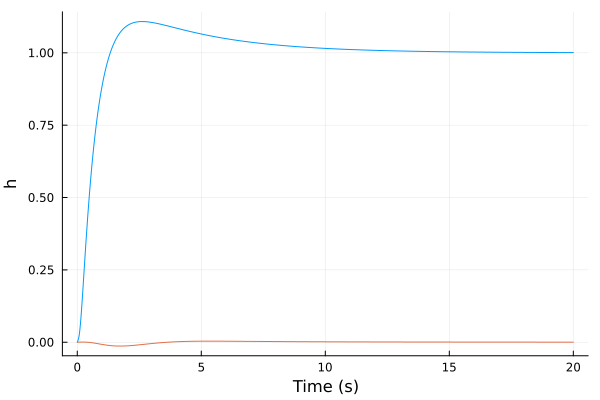

In [77]:
#EAS reference to EAS step response
step(P_vh[:EAS, :EAS_ref], 20) |> stepinfo |> display
step(P_vh[:EAS, :EAS_ref], 20) |> plot
#EAS reference to altitude step response
step(P_vh[:h, :EAS_ref], 20) |> plot!

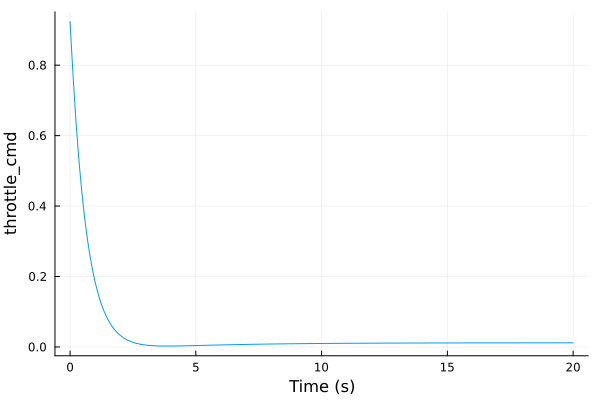

In [78]:
step(P_vh[:throttle_cmd, :EAS_ref], 20) |> plot

StepInfo:
Initial value:     0.000
Final value:       1.018
Step size:         1.018
Peak:              1.142
Peak time:         4.062 s
Overshoot:         12.15 %
Undershoot:         0.11 %
Settling time:    14.271 s
Rise time:         1.541 s


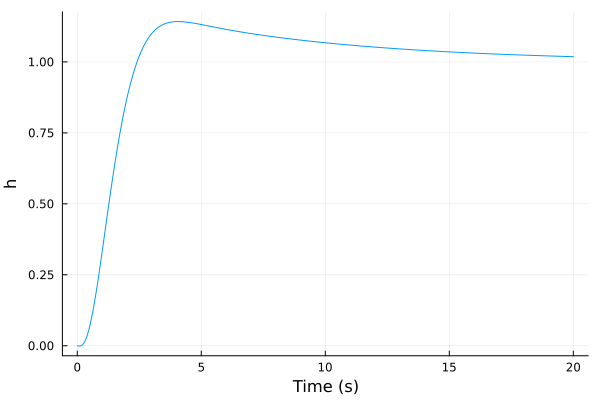

In [79]:
step(P_vh[:h, :h_ref], 20) |> stepinfo |> display
step(P_vh[:h, :h_ref], 20) |> plot
# step(P_vh[:elevator_cmd, :h_ref], 20) |> plot!

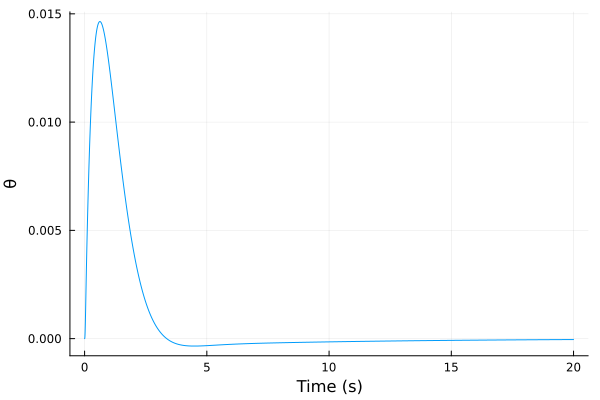

In [80]:
step(P_vh[:θ, :h_ref], 20) |> plot

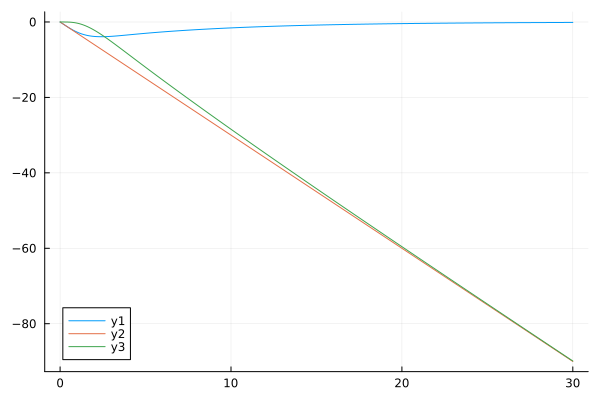

In [ ]:
#compute tracking error for a -2m/s altitude ramp
t_out, u_out, h_out = let
u_test(x,t) = [0, -2t]
y, t, x, u = lsim(P_vh, u_test, 0:0.01:30)
(t, u[2, :], x[5, :]) #extract h_ref from u, and h from x (see labels)
end
plot(t_out, u_out - h_out)
plot!(t_out, u_out)
plot!(t_out, h_out)
